In [1]:
import os
import cv2
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from src.dataset import VDAODataset
from torch.utils.data import DataLoader

from src.utils import MCC, DIS, conf_mat

# Result folder
res_folder = '/home/luiz.tavares/Workspace/VDAO_Pixel/results/test_results/LightGBM_warp/'


/home/luiz.tavares/.local/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: /nfs/home/luiz.tavares/.local/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c104impl8GPUTrace13gpuTraceStateE
  warn(f"Failed to load image Python extension: {e}")


(-0.5, 1151.5, 647.5, -0.5)

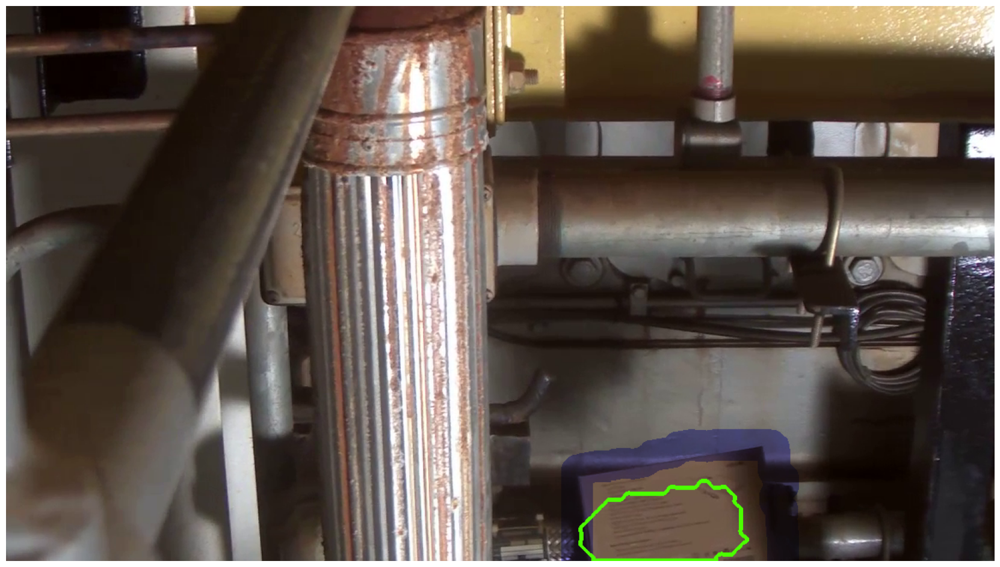

In [ ]:
expl_dict={0:{'fold':6, 'vid':2, 'frame':180}, 1:{'fold':7, 'vid':2, 'frame':170}, 2:{'fold':8, 'vid':2, 'frame':190},
           3:{'fold':9, 'vid':0, 'frame':20}, 4:{'fold':9, 'vid':2, 'frame':160}, 5:{'fold':2, 'vid':2, 'frame':170},
           6:{'fold':3, 'vid':5, 'frame':170}, 7:{'fold':5, 'vid':2, 'frame':165}}
fold = 7
vid = 5
frame = 65

dataset = VDAODataset(fold = fold, split = -1, type = 'test',
                      alignment = 'warp', transform = False)
dd = dataset.align_df
vid_list = dd.test_file.unique()
vid_idx = int(vid_list[vid])

# Loading target frame
dd_vid = dd[dd.test_file==vid_idx]
dd_index = int(dd_vid[dd_vid.test_frame==frame].index[0])

loader = DataLoader(dataset, num_workers=8, batch_size=1, shuffle=False)
_, tar_frame, sil_frame , _   = dataset.__getitem__(dd_index)
w, h = tar_frame.shape[1], tar_frame.shape[0]

# Loading detection
pred_path = os.path.join(res_folder, '{0:02d}.pkl'.format(vid_idx))
prd = pickle.load(open(pred_path,'rb'))
prd_frame = prd['video'][frame]
prd_frame = cv2.resize(prd_frame, dsize=(w, h), interpolation=cv2.INTER_CUBIC)

# Adding shadow to dont care area
def_pixels = sil_frame != 0.5
def_pixels_colour = cv2.cvtColor(def_pixels.astype('uint8'), cv2.COLOR_GRAY2RGB)
# def_pixels_colour[:,:,0] = 1
# def_pixels_colour[:,:,1] = 1
def_pixels_colour[:,:,2] = 1

#=def_pixels_colour[:,:,1] = 1

def_target = def_pixels_colour*tar_frame
# tar_frame = (tar_frame*0.6 + def_target*0.4).astype('uint8')
 
# Contours
contours_pred  = cv2.findContours(prd_frame, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)[0]
# img = (tar_frame.copy()).astype('uint8') + prd_frame //2
img = tar_frame.copy()
# img = cv2.drawContours(img, contours_pred, -1, (75,255,0), 4)    
    

plt.figure(figsize=(30,12))
plt.imshow(img)
plt.axis('off')
# plt.savefig('./images/chapter3/test_obj{0}_pred.png'.format(idx), 
#             transparent = True, bbox_inches = 'tight', pad_inches = 0, format='png', dpi=200)

In [ ]:
valid_pix = np.where(sil_frame != 0.5)
tn, fp, fn, tp = conf_mat(sil_frame[valid_pix], prd_frame[valid_pix]).ravel()

mcc = MCC(tn, fp, fn, tp)
dis = DIS(tn, fp, fn, tp)

print(mcc, dis)

0.7946662219931513 0.3616400996849579


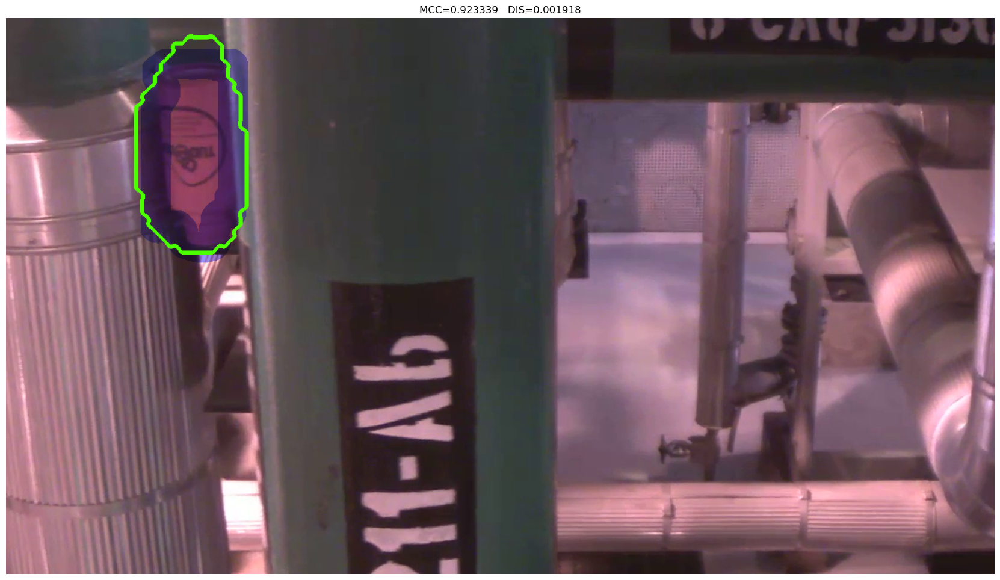

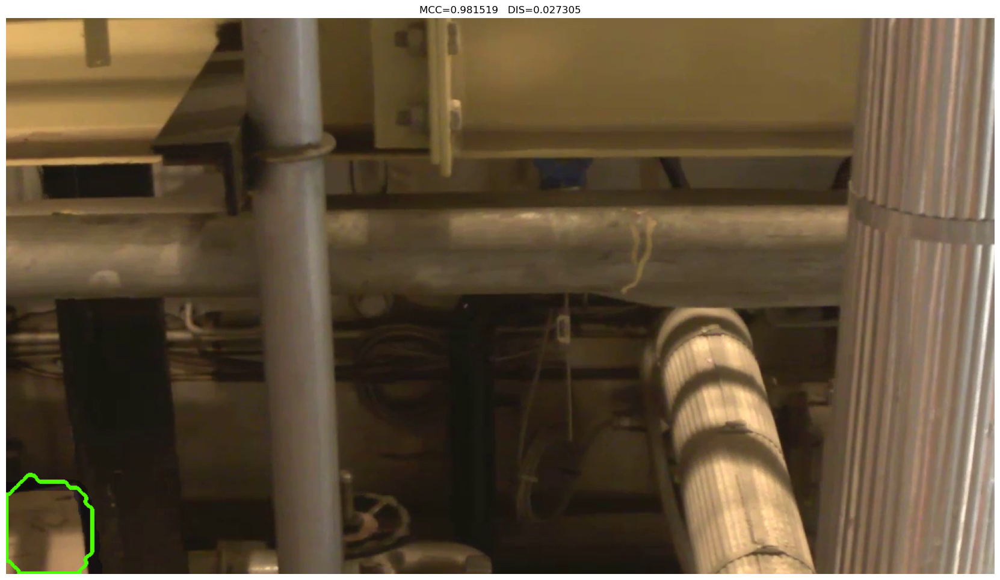

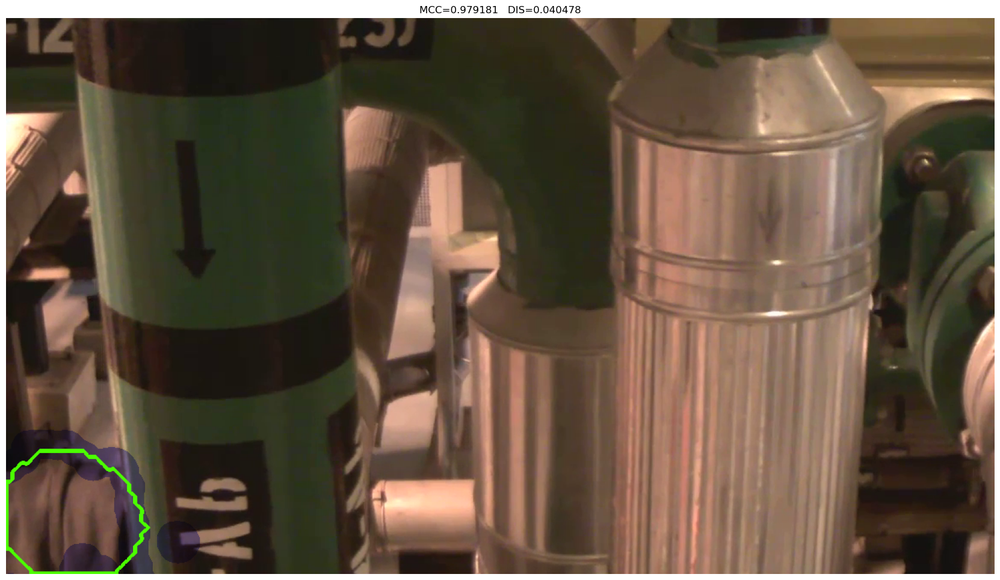

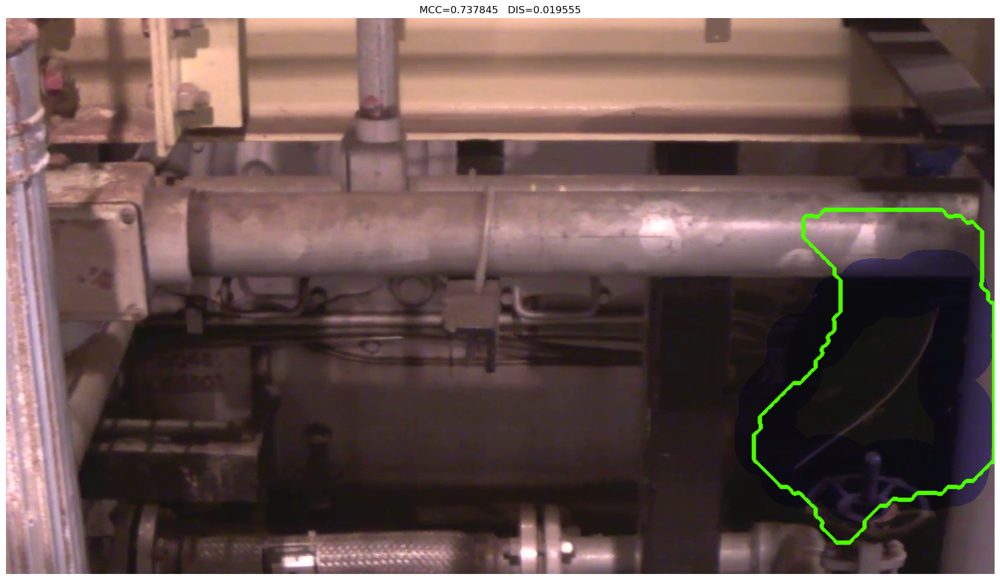

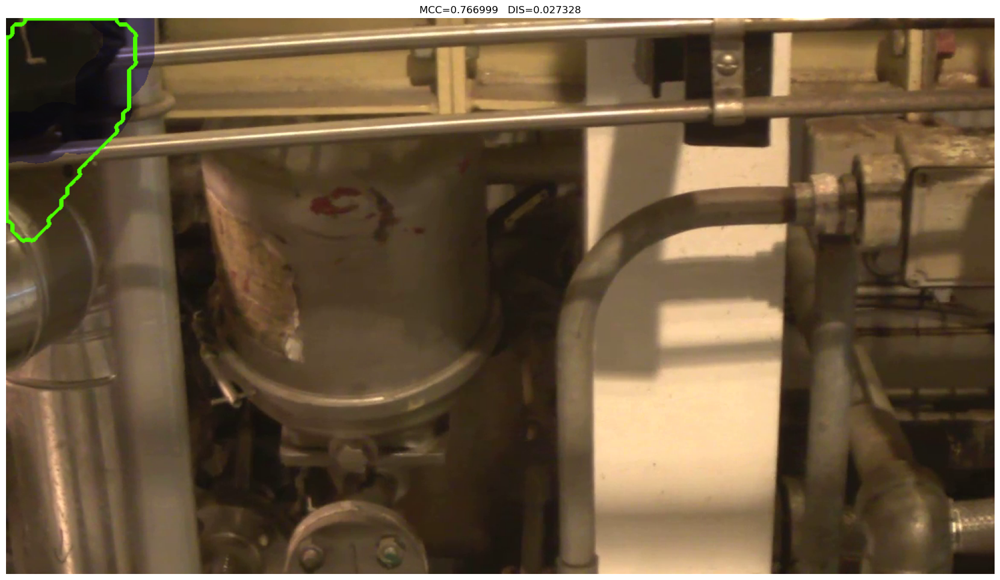

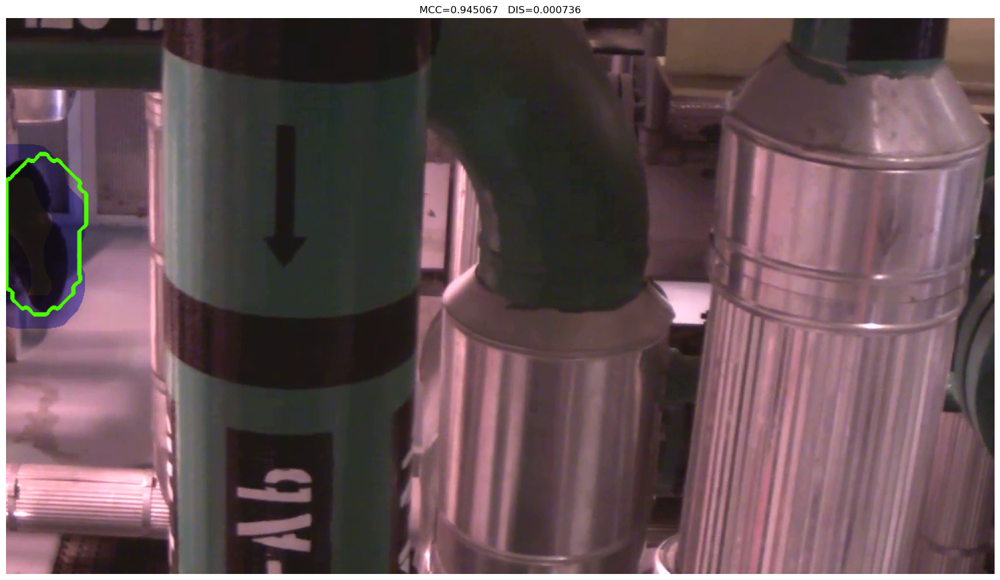

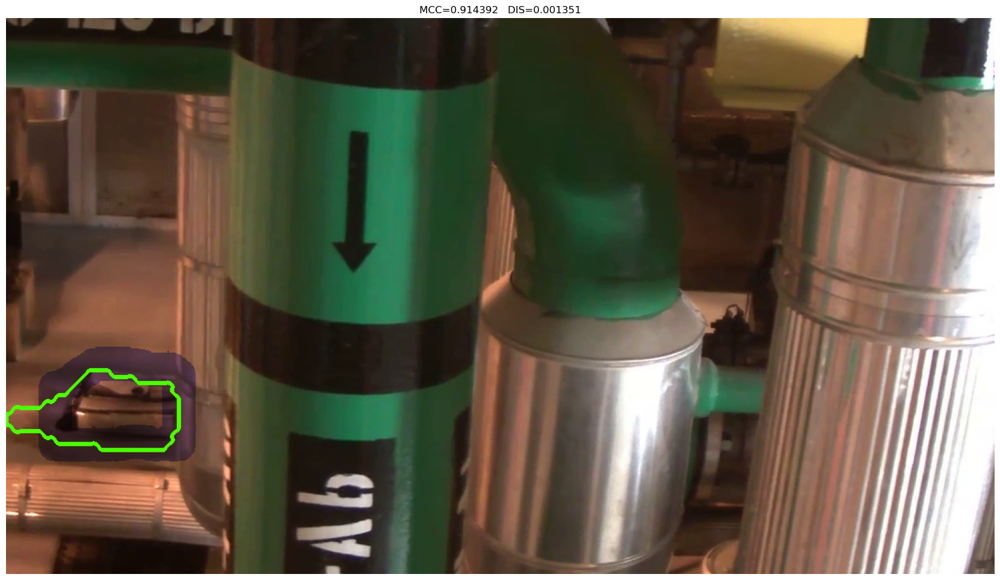

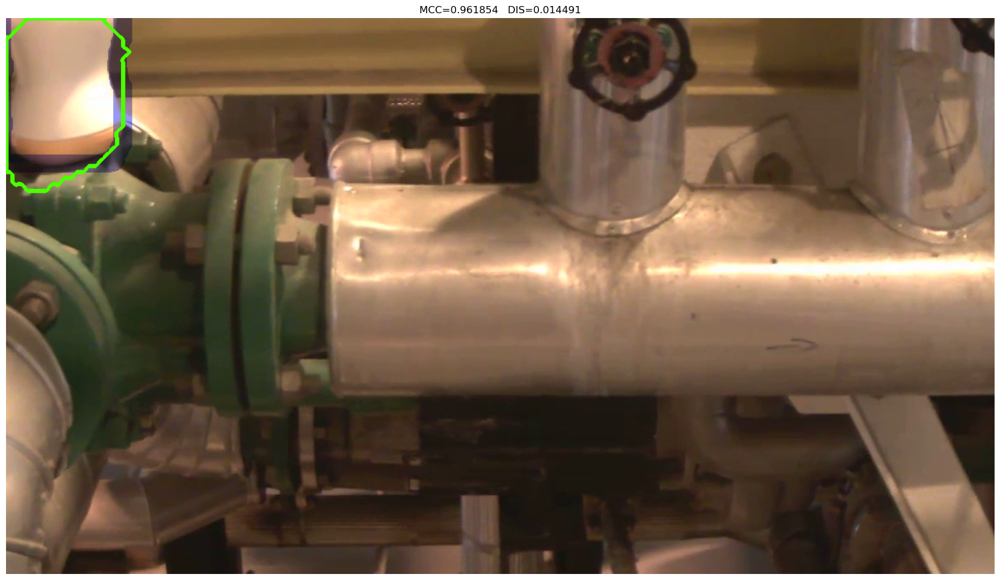

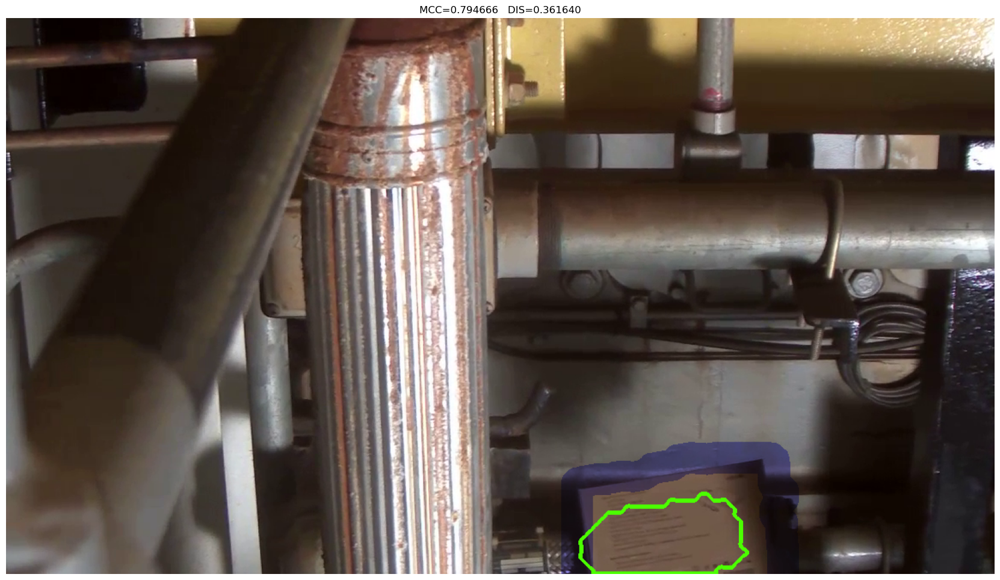

In [ ]:
expl_dict={0:{'fold':6, 'vid':2, 'frame':180}, 1:{'fold':7, 'vid':2, 'frame':170}, 2:{'fold':8, 'vid':2, 'frame':190},
           3:{'fold':9, 'vid':0, 'frame':20}, 4:{'fold':9, 'vid':2, 'frame':160}, 5:{'fold':2, 'vid':2, 'frame':170},
           6:{'fold':3, 'vid':5, 'frame':170}, 7:{'fold':5, 'vid':2, 'frame':165}, 8:{'fold':7, 'vid':5, 'frame':65}}

for idx,key in enumerate(list(expl_dict.keys())):
    
    fold = expl_dict[key]['fold']
    vid = expl_dict[key]['vid']
    frame = expl_dict[key]['frame']
    
    dataset = VDAODataset(fold = fold, split = -1, type = 'test',
                        alignment = 'warp', transform = False)
    dd = dataset.align_df
    vid_list = dd.test_file.unique()
    vid_idx = int(vid_list[vid])

    # Loading target frame
    dd_vid = dd[dd.test_file==vid_idx]
    dd_index = int(dd_vid[dd_vid.test_frame==frame].index[0])

    loader = DataLoader(dataset, num_workers=8, batch_size=1, shuffle=False)
    _, tar_frame, sil_frame , _   = dataset.__getitem__(dd_index)
    w, h = tar_frame.shape[1], tar_frame.shape[0]

    # Loading detection
    pred_path = os.path.join(res_folder, '{0:02d}.pkl'.format(vid_idx))
    prd = pickle.load(open(pred_path,'rb'))
    prd_frame = prd['video'][frame]
    prd_frame = cv2.resize(prd_frame, dsize=(w, h), interpolation=cv2.INTER_CUBIC)

    # Adding shadow to dont care area
    def_pixels = sil_frame != 0.5
    def_pixels_colour = cv2.cvtColor(def_pixels.astype('uint8'), cv2.COLOR_GRAY2RGB)
    def_pixels_colour[:,:,2] = 1
    def_target = def_pixels_colour*tar_frame
    tar_frame = (tar_frame*0.6 + def_target*0.4).astype('uint8')

    # Contours
    contours_pred  = cv2.findContours(prd_frame, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)[0]
    # img = (tar_frame.copy()).astype('uint8') + prd_frame //2
    img = tar_frame
    img = cv2.drawContours(img, contours_pred, -1, (75,255,0), 4)    
        
    valid_pix = np.where(sil_frame != 0.5)
    tn, fp, fn, tp = conf_mat(sil_frame[valid_pix], prd_frame[valid_pix]).ravel()

    mcc = MCC(tn, fp, fn, tp)
    dis = DIS(tn, fp, fn, tp)

    plt.figure(figsize=(30,12))
    plt.title('MCC={0:04f}   DIS={1:04f}'.format(mcc,dis))
    plt.imshow(img)
    plt.axis('off')
    plt.savefig('/home/luiz.tavares/Temp/paper_img{0}_pred.png'.format(idx), 
                transparent = True, bbox_inches = 'tight', pad_inches = 0, format='png', dpi=200)


In [ ]:
from v200_table import idx2vid, idx2object
vid2idx    = {idx2vid[k]:k for k in idx2vid}
VID_FOLDER = '/home/luiz.tavares/Workspace/VDAO_Pixel/results/outputs/'
database   = 'RF_MVW'
frame_vec = [100, 170, 5, 
             10, 150, 30,
             80, 130, 100,
            199, 10]


for idx, file_num in enumerate([1, 8, 39, 23, 15, 20, 37, 26, 28, 41, 46]):

    # reading annotation file 
    align_df  = pd.read_csv('/home/luiz.tavares/Workspace/VDAO_Pixel/dataset/alignment_vdao.csv', index_col=0)
    beg_frame = tables['table {0:02d}'.format(file_num)]['target start frame']
    end_frame = tables['table {0:02d}'.format(file_num)]['target final frame']
    tar_file  = vid2idx[tables['table {0:02d}'.format(file_num)]['target file']]
    align_df  = align_df.loc[(align_df['test']) & (align_df['target_file']==tar_file)]
    align_df  = align_df.loc[(align_df['target_frame']<=end_frame) & (align_df['target_frame']>=beg_frame)]

    # captures
    cap_box = cv2.VideoCapture(VID_FOLDER + '{0}/{1:02d}.avi'.format('bbox_old', file_num))
    cap_sil = cv2.VideoCapture(VID_FOLDER + '{0}/{1:02d}.avi'.format('sil', file_num))
    cap_vid = cv2.VideoCapture(VID_FOLDER + '{0}/{1:02d}.avi'.format(database, file_num))
    cap_tar = cv2.VideoCapture(VID_FOLDER + '{0}/{1:02d}.avi'.format('tar', file_num))

    frame_num = frame_vec[idx]

    # setting frames
    cap_box.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
    cap_sil.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
    cap_vid.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
    cap_tar.set(cv2.CAP_PROP_POS_FRAMES, frame_num)

    _, box_frame = cap_box.read()
    _, sil_frame = cap_sil.read()
    _, vid_frame = cap_vid.read()
    _, tar_frame = cap_tar.read()

    # converting target and fix silhouette
    sil_frame[sil_frame>200] = 255
    sil_frame[sil_frame<55]  = 0
    sil_frame[(sil_frame>0) & (sil_frame<255)]  = 127
    box_frame[box_frame>200] = 255
    box_frame[box_frame<55]  = 0
    box_frame[(box_frame>0) & (box_frame<255)]  = 127
    sil_frame = cv2.cvtColor(sil_frame.astype('uint8'), cv2.COLOR_BGR2GRAY)
    box_frame = cv2.cvtColor(box_frame.astype('uint8'), cv2.COLOR_BGR2GRAY)

    # upsampling
    vid_frame = cv2.resize(vid_frame, (tar_frame.shape[1],tar_frame.shape[0]), interpolation=cv2.INTER_NEAREST)
    tar_frame = cv2.cvtColor(tar_frame, cv2.COLOR_BGR2RGB)
    vid_frame = (vid_frame > 127).astype('uint8')
    vid_frame_bin = 1-vid_frame/2
    vid_frame[:,:,0] *= 75
    vid_frame[:,:,1] *= 255
    vid_frame[:,:,2] *= 0

    # Contours
    contours_pred, _  = cv2.findContours(vid_frame[:,:,1], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours_out, _   = cv2.findContours(cv2.threshold(sil_frame, 50, 255, cv2.THRESH_BINARY)[1], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours_in , _   = cv2.findContours(cv2.threshold(sil_frame, 200, 255, cv2.THRESH_BINARY)[1], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    img               = (tar_frame.copy()*vid_frame_bin).astype('uint8') + vid_frame //2
    img = cv2.drawContours(img, contours_pred, -1, (75,255,0), 4)    
    
    
    plt.figure(figsize=(30,12))
    plt.imshow(img)
    plt.axis('off')
    plt.savefig('./images/chapter3/test_obj{0}_pred.png'.format(idx), transparent = True, bbox_inches = 'tight', pad_inches = 0, format='png', dpi=200)

ModuleNotFoundError: No module named 'v200_table'

#### Some statistics

In [22]:
sum_total, sum_fg, sum_dc = 0, 0 , 0
for f in range(1,10):
    dataset = VDAODataset(fold = f, split = 0, type = 'training',
                        alignment = 'temporal', transform = False)

    len_ds = len(dataset)
    for k in range(len_ds):
        _, _, sil_frame , _   = dataset.__getitem__(k)


        sum_total += np.size(sil_frame)
        sum_fg += np.sum(sil_frame == 1)
        sum_dc += np.sum(sil_frame == 0.5)



In [23]:
sum_total, sum_fg, sum_dc, sum_fg/sum_total, sum_dc/sum_total

(10299801600, 684021526, 746197162, 0.06641113611353446, 0.0724477219056336)

### Sampling figure

(-0.5, 1151.5, 647.5, -0.5)

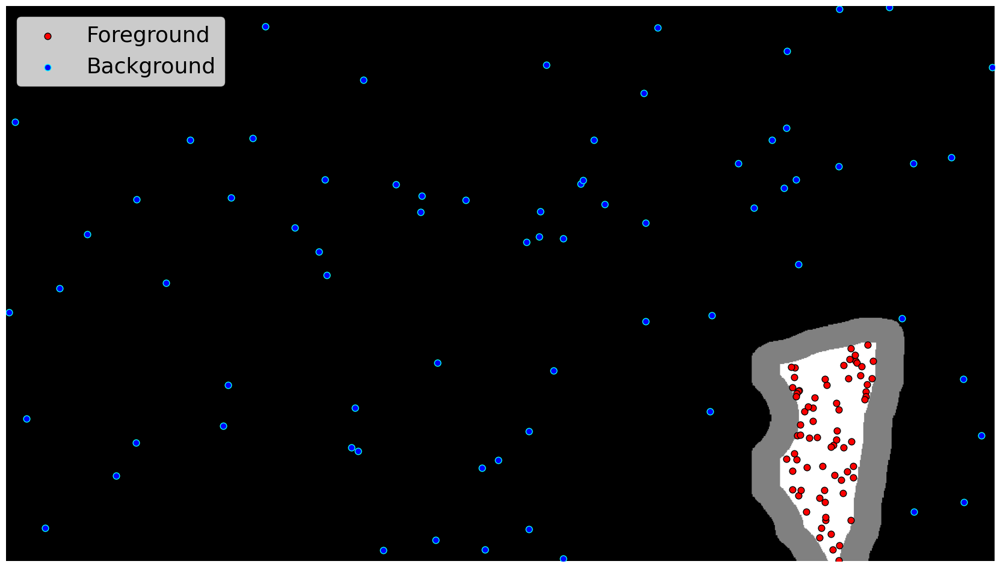

In [62]:
expl_dict={0:{'fold':6, 'vid':2, 'frame':180}, 1:{'fold':7, 'vid':2, 'frame':170}, 2:{'fold':8, 'vid':2, 'frame':190},
           3:{'fold':9, 'vid':0, 'frame':20}, 4:{'fold':9, 'vid':2, 'frame':160}, 5:{'fold':2, 'vid':2, 'frame':170},
           6:{'fold':3, 'vid':5, 'frame':170}, 7:{'fold':5, 'vid':2, 'frame':165}}
fold = 2
vid = 5
frame = 60

dataset = VDAODataset(fold = fold, split = 0, type = 'training',
                      alignment = 'warp', transform = False)
dd = dataset.align_df
vid_list = dd.target_file.unique()
vid_idx = int(vid_list[vid])

# Loading target frame
dd_vid = dd[dd.target_file==vid_idx]
dd_index = int(dd_vid.iloc[frame,:].name)

loader = DataLoader(dataset, num_workers=8, batch_size=1, shuffle=False)
_, _, sil_frame , _   = dataset.__getitem__(dd_index)
w, h = sil_frame.shape[1], sil_frame.shape[0]


fg_pixels = np.argwhere(sil_frame == 1)
bg_pixels = np.argwhere(sil_frame == 0)

np.random.shuffle(fg_pixels)
np.random.shuffle(bg_pixels)

fg_pixels = fg_pixels[:72,:]
bg_pixels = bg_pixels[:72,:]

# sil_frame = sil_frame[::4,::4]
# # Adding shadow to dont care area
# def_pixels = sil_frame != 0.5
# def_pixels_colour = cv2.cvtColor(def_pixels.astype('uint8'), cv2.COLOR_GRAY2RGB)
# # def_pixels_colour[:,:,0] = 1
# # def_pixels_colour[:,:,1] = 1
# def_pixels_colour[:,:,2] = 1

# #=def_pixels_colour[:,:,1] = 1

# def_target = def_pixels_colour*tar_frame
# tar_frame = (tar_frame*0.6 + def_target*0.4).astype('uint8')
 
# # Contours
# contours_pred  = cv2.findContours(prd_frame, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)[0]
# # img = (tar_frame.copy()).astype('uint8') + prd_frame //2
# img = tar_frame.copy()
# img = cv2.drawContours(img, contours_pred, -1, (75,255,0), 4)    
    

plt.figure(figsize=(30,12))
plt.imshow(sil_frame, cmap='gray')
plt.scatter(fg_pixels[:, 1], fg_pixels[:, 0], marker="o", color="red", s=60,edgecolors='black', label='Foreground')
plt.scatter(bg_pixels[:, 1], bg_pixels[:, 0], marker="o", color="blue", s=60,edgecolors='cyan', label='Background')
plt.legend(loc=2, prop={'size': 26})
plt.axis('off')

In [26]:
dd

,reference_file,target_file,silhouette_file,reference_frame,target_frame,target_obj,activity,test,bounding_box,subbox_1,subbox_2,subbox_3,num_pixels,test_file,test_frame,homography
0,1,1,1,1624,1359,1,True,False,"0, 101, 52, 380",NaN,NaN,NaN,41595.0,NaN,NaN,"0.9999999991372323,-4.1539558015490745e-05,0.0..."
1,1,1,1,1634,1367,1,True,False,"0, 100, 74, 388",NaN,NaN,NaN,61260.0,NaN,NaN,"0.9999999999989547,-1.4459331027089073e-06,-0...."
2,1,1,1,1640,1375,1,True,False,"0, 99, 96, 396",NaN,NaN,NaN,79497.0,NaN,NaN,"0.9999998316408071,0.0005802743812963751,0.842..."
3,1,1,1,1650,1383,1,True,False,"0, 95, 118, 399",NaN,NaN,NaN,108045.0,NaN,NaN,"0.9999999991670145,4.081629990105792e-05,0.180..."
4,1,1,1,1657,1391,1,True,False,"0, 89, 140, 398",NaN,NaN,NaN,130314.0,NaN,NaN,"0.9999999888681282,-0.00014921040062935292,-0...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10096,2,28,28,10442,5096,9,True,False,"522, 377, 862, 720",NaN,NaN,NaN,428751.0,NaN,NaN,"0.9999974145208688,0.0022739726424947614,-0.76..."
10097,2,28,28,10452,5104,9,True,False,"512, 378, 852, 720",NaN,NaN,NaN,428844.0,NaN,NaN,"0.9999989110087373,0.001475798543330467,-0.491..."
10098,2,28,28,10460,5112,9,True,False,"502, 378, 845, 720",NaN,NaN,NaN,432447.0,NaN,NaN,"0.9999996849280686,0.0007938159505648801,-1.10..."
10099,2,28,28,10467,5120,9,True,False,"492, 379, 839, 720",NaN,NaN,NaN,435039.0,NaN,NaN,"0.9999999971285296,7.57821968351835e-05,0.7161..."


In [46]:


bg_pixels

array([[ 403,  865],
       [   2, 1126],
       [ 317,   60],
       [ 267,  531],
       [   8,  674],
       [ 293,  286],
       [  60,  617],
       [ 241, 1064],
       [ 418, 1100],
       [ 303,  794],
       [ 184,  597],
       [ 563,  555],
       [ 414,  209],
       [ 495,  281],
       [ 116,   20],
       [ 214,  809],
       [ 320,  295],
       [ 167,  188],
       [ 534,  541],
       [ 233, 1085],
       [ 421,   80],
       [ 181,  842],
       [  48,   22],
       [ 392,  516],
       [ 567,  539],
       [ 428,  343],
       [ 127,  744],
       [ 256,  302],
       [ 115,  810],
       [ 501,  651],
       [ 366,  545],
       [ 404,  543],
       [ 365,  300],
       [ 171,  279],
       [ 558,  411],
       [ 494,  492],
       [ 489, 1044],
       [ 619,  875],
       [ 123, 1007],
       [ 422,   17],
       [ 449,  360],
       [ 193,   59],
       [  74,  167],
       [ 536,  367],
       [ 283,   94],
       [ 530,  170],
       [ 234,  892],
       [ 516,